<a href="https://colab.research.google.com/github/anikch/paddy/blob/main/code4_paddy_efficientnet_b4_exp1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow_addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install keras_cv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from functools import partial
import posixpath
from keras import models, regularizers, layers, optimizers, losses, metrics
import keras_cv
from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.utils import plot_model

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
tensorboard_log_dir= '/content/drive/MyDrive/thesis/tensorboard_logs/Code4_Paddy_EfficientNet-B4_exp1'

In [6]:
!nvidia-smi

Thu Nov  3 19:01:26 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  A100-SXM4-40GB      Off  | 00000000:00:04.0 Off |                    0 |
| N/A   29C    P0    46W / 400W |      0MiB / 40536MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [7]:
colab= '/content/drive/MyDrive'
local= r'G:\My Drive'

code_runtime= colab

In [8]:
tf.__version__

'2.9.2'

In [9]:
file1= 'thesis/dataset/paddy_doctor/train.csv'
inp_file = posixpath.join(code_runtime, file1)

train_table=pd.read_csv(inp_file)
train_table

,image_id,label,variety,age
0,100330.jpg,bacterial_leaf_blight,ADT45,45
1,100365.jpg,bacterial_leaf_blight,ADT45,45
2,100382.jpg,bacterial_leaf_blight,ADT45,45
3,100632.jpg,bacterial_leaf_blight,ADT45,45
4,101918.jpg,bacterial_leaf_blight,ADT45,45
...,...,...,...,...
10402,107607.jpg,tungro,Zonal,55
10403,107811.jpg,tungro,Zonal,55
10404,108547.jpg,tungro,Zonal,55
10405,110245.jpg,tungro,Zonal,55


In [10]:
labels=list(np.unique(train_table['label']))
labels

['bacterial_leaf_blight',
 'bacterial_leaf_streak',
 'bacterial_panicle_blight',
 'blast',
 'brown_spot',
 'dead_heart',
 'downy_mildew',
 'hispa',
 'normal',
 'tungro']

In [11]:
train_dir= 'thesis/dataset/paddy_doctor/train/'
val_dir= 'thesis/dataset/paddy_doctor/val/'
img_size= 224

train_files= posixpath.join(code_runtime, train_dir)
test_files= posixpath.join(code_runtime, val_dir)

train_data= tf.keras.utils.image_dataset_from_directory(train_files,
                                                        labels='inferred',
                                                        label_mode='categorical',
                                                        validation_split=0.2,
                                                        subset="training",
                                                        class_names=labels,
                                                        color_mode='rgb',
                                                        image_size=(img_size, img_size),
                                                        shuffle=True,
                                                        seed= 42,
                                                        batch_size= 16)

val_data= tf.keras.utils.image_dataset_from_directory(train_files,
                                                        labels= 'inferred',
                                                        label_mode='categorical',
                                                        validation_split=0.2,
                                                        subset="validation",
                                                        class_names= labels,
                                                        color_mode='rgb',
                                                        image_size=(img_size, img_size),
                                                        shuffle=True,
                                                        seed= 42,
                                                        batch_size= 16)


test_datagen= ImageDataGenerator()
test_data= test_datagen.flow_from_directory(test_files,
                                            target_size= (img_size, img_size),
                                            batch_size= 16,
                                            shuffle = False, 
                                            class_mode='categorical')

Found 14302 files belonging to 10 classes.
Using 11442 files for training.
Found 14302 files belonging to 10 classes.
Using 2860 files for validation.
Found 1500 images belonging to 10 classes.


In [12]:
class_names = train_data.class_names
print(class_names)

['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']


In [13]:
test_data.class_indices

{'bacterial_leaf_blight': 0,
 'bacterial_leaf_streak': 1,
 'bacterial_panicle_blight': 2,
 'blast': 3,
 'brown_spot': 4,
 'dead_heart': 5,
 'downy_mildew': 6,
 'hispa': 7,
 'normal': 8,
 'tungro': 9}

## Augmentation Pipeline

In [26]:
# data augmentation
def augment_train_data(images, labels):
  inputs= {"images": images, "labels": labels}
  layers= keras_cv.layers.RandAugment.get_standard_policy(value_range=(0, 255), geometric= True, magnitude= 0.5, magnitude_stddev= 0.2)
  layers= layers[1:3] + layers[8:] + [keras_cv.layers.preprocessing.RandomFlip(mode= 'horizontal'),
                         keras_cv.layers.preprocessing.RandomRotation(0.2),
                    keras_cv.layers.preprocessing.RandomRotation(factor= .1, seed= 42),
                    keras_cv.layers.GridMask(ratio_factor= (.0, .3), rotation_factor= (.0,.1), fill_mode= 'gaussian_noise'), 
                    #keras_cv.layers.RandomColorJitter(brightness_factor= .5, contrast_factor= .5, hue_factor= .2, saturation_factor= (.1, .9), value_range= [0, 255])
                    ]
  aug_pipeline= keras_cv.layers.RandomAugmentationPipeline(layers= layers, augmentations_per_image= 3, rate= .5)
  outputs= aug_pipeline(inputs)
  print(*layers)
  return outputs['images'], outputs['labels']

In [27]:
AUTOTUNE= tf.data.AUTOTUNE
train_aug_ds= train_data.map(augment_train_data, num_parallel_calls= tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
val_ds= val_data.prefetch(buffer_size= AUTOTUNE)

<keras_cv.layers.preprocessing.equalization.Equalization object at 0x7fc64405e290> <keras_cv.layers.preprocessing.solarization.Solarization object at 0x7fc646385990> <keras.layers.preprocessing.image_preprocessing.RandomTranslation object at 0x7fc6462e1ed0> <keras.layers.preprocessing.image_preprocessing.RandomTranslation object at 0x7fc647ba3a50> <keras_cv.layers.preprocessing.random_flip.RandomFlip object at 0x7fc644052750> <keras_cv.layers.preprocessing.random_rotation.RandomRotation object at 0x7fc6470ab410> <keras_cv.layers.preprocessing.random_rotation.RandomRotation object at 0x7fc64405e490> <keras_cv.layers.preprocessing.grid_mask.GridMask object at 0x7fc6463ef5d0>


## EfficientNet-B4 (Online Augmentation + Transfer Learning + SGD + Fine Tune)

In [28]:
base_model= tf.keras.applications.EfficientNetB4(
    include_top= False,
    weights= 'imagenet',
    input_shape=(img_size, img_size, 3),
    pooling= 'max'
)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.829965 to fit



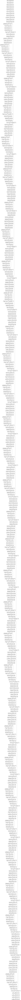

In [29]:
tf.keras.utils.plot_model(
    base_model,
    show_shapes= True,
    show_layer_names= True,
    show_layer_activations= True,
    dpi= 72
)

In [30]:
inputs= tf.keras.Input(shape= (img_size, img_size, 3))
preprocess_layer= tf.keras.applications.efficientnet.preprocess_input(inputs)
normalization_layer= tf.keras.layers.Rescaling(scale= 1./127.5, offset= -1)(preprocess_layer)
x= base_model(normalization_layer)
x= tf.keras.layers.Dropout(0.25)(x)
outputs= tf.keras.layers.Dense(10, activation= 'softmax')(x)

In [31]:
model= tf.keras.Model(inputs= inputs, outputs= outputs, name= "EfficientNetB4_TL_augmentation")

In [32]:
model.summary()

Model: "EfficientNetB4_TL_augmentation"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 efficientnetb4 (Functional)  (None, 1792)             17673823  
                                                                 
 dropout_1 (Dropout)         (None, 1792)              0         
                                                                 
 dense_1 (Dense)             (None, 10)                17930     
                                                                 
Total params: 17,691,753
Trainable params: 17,566,546
Non-trainable params: 125,207
_________________________________________________________________


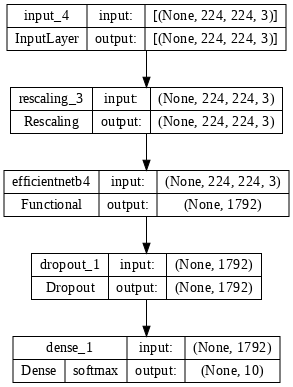

In [33]:
tf.keras.utils.plot_model(
    model,
    show_shapes= True,
    show_layer_names= True,
    show_layer_activations= True,
    dpi= 72
)

In [34]:
n_epochs= 100
filepath= 'model-training-{epoch:02d}-{val_accuracy:.4f}.hdf5'
checkpoint_callback= ModelCheckpoint(filepath, monitor= 'val_accuracy', verbose= 1, save_best_only= True, mode= 'max')
early_stop_callback= EarlyStopping(monitor='val_accuracy', patience= 10, verbose= 1, mode='max', restore_best_weights= True)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir= tensorboard_log_dir, write_graph= True, write_images= True, histogram_freq= 1)

callbacks_list= [checkpoint_callback, early_stop_callback, tensorboard_callback]

In [35]:
optimizer_adam_amsgrad= tf.keras.optimizers.Adam(learning_rate= 1e-4, amsgrad= True)
optimizer_adam= tf.keras.optimizers.Adam(learning_rate= 1e-4, amsgrad= False)
optimizer_sgd= tf.keras.optimizers.SGD(learning_rate= 1e-4, momentum= 0.9)

In [36]:
model.compile(
        optimizer= optimizer_sgd,
        loss = 'categorical_crossentropy', 
        metrics = ['accuracy', tfa.metrics.F1Score(average='macro', num_classes= 10)]
        )

In [37]:
%%time
history= model.fit(train_aug_ds,
                  epochs= n_epochs,
                  validation_data= val_ds,
                  callbacks= callbacks_list,
                  verbose= 1)

Epoch 1/100
716/716 [==============================] - ETA: 0s - loss: 3.2991 - accuracy: 0.2474 - f1_score: 0.2465
Epoch 1: val_accuracy improved from -inf to 0.38427, saving model to model-training-01-0.3843.hdf5
716/716 [==============================] - 203s 258ms/step - loss: 3.2991 - accuracy: 0.2474 - f1_score: 0.2465 - val_loss: 2.1001 - val_accuracy: 0.3843 - val_f1_score: 0.3603
Epoch 2/100
716/716 [==============================] - ETA: 0s - loss: 1.7985 - accuracy: 0.4515 - f1_score: 0.4497
Epoch 2: val_accuracy improved from 0.38427 to 0.54091, saving model to model-training-02-0.5409.hdf5
716/716 [==============================] - 179s 251ms/step - loss: 1.7985 - accuracy: 0.4515 - f1_score: 0.4497 - val_loss: 1.3916 - val_accuracy: 0.5409 - val_f1_score: 0.5210
Epoch 3/100
716/716 [==============================] - ETA: 0s - loss: 1.3216 - accuracy: 0.5606 - f1_score: 0.5577
Epoch 3: val_accuracy improved from 0.54091 to 0.65175, saving model to model-training-03-0.6517.

In [43]:
model.evaluate(test_data, batch_size= 16, return_dict= True)

94/94 [==============================] - 359s 4s/step - loss: 0.3572 - accuracy: 0.9287 - f1_score: 0.9282


{'loss': 0.3572424054145813,
 'accuracy': 0.9286666512489319,
 'f1_score': 0.9281673431396484}

94/94 [==============================] - 10s 102ms/step - loss: 0.3572 - accuracy: 0.9287 - f1_score: 0.9282


{'loss': 0.3572424054145813,
 'accuracy': 0.9286666512489319,
 'f1_score': 0.9281673431396484}

In [44]:
model.save('/content/drive/MyDrive/thesis/tensorboard_logs/Code4_Paddy_EfficientNet-B4_exp1/model.h5')

In [40]:
# Generating Confusion Matrix and Classification Report
Y_pred= model.predict_generator(test_data, 1500// 16 + 1)
y_pred= np.argmax(Y_pred, axis= 1)
print('Confusion Matrix')
conf_matrix= confusion_matrix(test_data.classes, y_pred)
conf_mat = np.array2string(conf_matrix)
#print(conf_matrix)
#print("=============================================================================================")
print('Classification Report')
target_names= test_data.class_indices
class_rep_vgg = classification_report(test_data.classes, y_pred, target_names=target_names)
print(class_rep_vgg)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


Confusion Matrix
Classification Report
                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.93      0.84      0.88       150
   bacterial_leaf_streak       0.94      0.97      0.95       150
bacterial_panicle_blight       0.98      0.97      0.97       150
                   blast       0.86      0.96      0.91       150
              brown_spot       0.94      0.91      0.93       150
              dead_heart       0.96      0.99      0.97       150
            downy_mildew       0.98      0.81      0.89       150
                   hispa       0.90      0.93      0.92       150
                  normal       0.94      0.96      0.95       150
                  tungro       0.88      0.95      0.91       150

                accuracy                           0.93      1500
               macro avg       0.93      0.93      0.93      1500
            weighted avg       0.93      0.93      0.93      1500



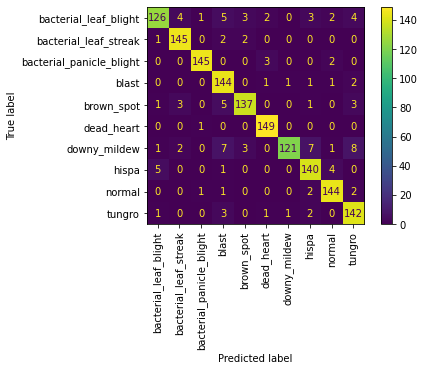

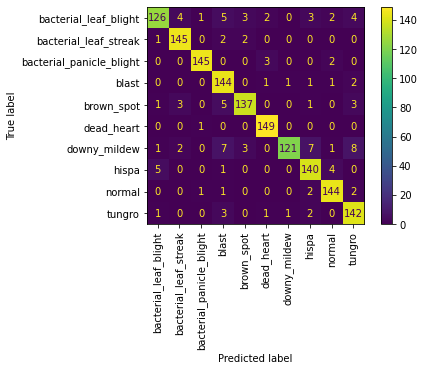

In [45]:
ConfusionMatrixDisplay.from_predictions(test_data.classes, y_pred, display_labels= target_names, xticks_rotation= 'vertical')

In [46]:
%tensorboard  --logdir /content/drive/MyDrive/thesis/tensorboard_logs/Code4_Paddy_EfficientNet-B4_exp1


<IPython.core.display.Javascript object>

Reusing TensorBoard on port 6006 (pid 11331), started 0:00:13 ago. (Use '!kill 11331' to kill it.)

<IPython.core.display.Javascript object>